In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from tensorflow.keras import models, layers, optimizers
from sklearn.utils import shuffle
import random
from sklearn.metrics import accuracy_score, r2_score, mean_squared_error, mean_absolute_error, confusion_matrix
import re
from scipy import stats
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsRegressor
from sklearn.cluster import KMeans, DBSCAN
from sklearn import tree
from datetime import datetime

# 1 - Objetivo
## 1.1 - Dado um tweet, prever a quem ele pertence (Bolsonaro ou Lula). Em seguida, saber qual será o possível engajamento (retweet).

# 2 - Carregando dados

In [2]:
df_bolsonaro = pd.read_json('./jairbolsonaro.json')[['full_text', 'retweet_count', 'favorite_count', 'created_at']]
df_lula = pd.read_json('./LulaOficial.json')[['full_text', 'retweet_count', 'favorite_count', 'created_at']]

# 3 - Tratamento

## 3.1 - Balanceamento

In [3]:
len(df_bolsonaro), len(df_lula)

(6794, 14961)

In [4]:
while len(df_lula) != len(df_bolsonaro):
    rand_row = random.choice(df_lula.index.tolist())
    df_lula = df_lula.drop([rand_row])

In [5]:
len(df_bolsonaro), len(df_lula)

(6794, 6794)

## 3.2 - Adição de features

In [6]:
def count_emoji(text):
    regrex_pattern = re.compile(pattern = "["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags = re.UNICODE)
    return regrex_pattern.findall(text)

def hashtag_count(text):
    regrex_pattern = re.compile(pattern = "[#]+")
    return regrex_pattern.findall(text)

def mark_count(text):
    regrex_pattern = re.compile(pattern = "[@]+")
    return regrex_pattern.findall(text)

In [7]:
for df in [df_bolsonaro, df_lula]:
    palavras = []
    emojis = []
    uppercase = []
    hashtag = []
    mark = []
    frases = []
    for text in df.full_text.to_list():
        palavras.append(len(text.split()))
        emojis.append(len(count_emoji(text)))
        hashtag.append(len(hashtag_count(text)))
        mark.append(len(mark_count(text)))
        frases.append(len(text.replace("...", ".").replace("..", ".").split(".")))

        count_upper = 0
        for word in text.split():
            if word.isupper():
                count_upper += 1
        uppercase.append(count_upper)
    df['word_count'] = palavras     #Quantidade de palavras
    df['emojis_count'] = emojis     #Quantidade de emojis
    df['upper_count'] = uppercase   #Quantidade de palavras em uppercase
    df['hastag_count'] = hashtag    #Quantidade de hashtags
    df['mark_count'] = mark         #Quantidade de marcações(@)
    df['frases'] = frases           #Quantidade de frases em um tweet

# rotulação para problema de classificação
df_bolsonaro['pessoa'] = "bolsonaro"
df_lula['pessoa'] = "lula"

df = pd.concat([df_lula, df_bolsonaro])

In [8]:
df['created_at'] = pd.to_datetime(df['created_at'])
df['created_at'] = df['created_at'].apply(lambda x: x.replace(tzinfo=None))

datas_eleitorais = [('2010-10-03', '2010-10-31'), ('2014-10-05', '2014-10-26'), ('2018-10-07', '2018-10-28'), ('2022-10-03', '2022-10-25')]

dias_eleicao_presidencial = []
for row in df.itertuples():
    dias_faltantes = 999999
    for data in datas_eleitorais:
        data_inicio = datetime.strptime(data[0], "%Y-%m-%d")
        data_fim = datetime.strptime(data[1], "%Y-%m-%d")
        if row.created_at >= data_inicio and row.created_at <= data_fim:
            dias_eleicao_presidencial.append(0)
            break
        if dias_faltantes >= min(abs((row.created_at - data_inicio).days), abs((row.created_at - data_fim).days)):
            dias_faltantes = min(abs((row.created_at - data_inicio).days), abs((row.created_at - data_fim).days))
        if data == datas_eleitorais[-1]:
            dias_eleicao_presidencial.append(dias_faltantes)

df['dias_eleicao_presidencial'] = dias_eleicao_presidencial

In [9]:
df['dias_eleicao_presidencial'].max()

721

In [10]:
datas_eleitorais = [('2008-10-05', '2008-10-26'), ('2012-10-07', '2012-10-28'), ('2016-10-02', '2016-10-30'), ('2020-11-15', '2020-11-29')]

dias_eleicao_municipais = []
for row in df.itertuples():
    dias_faltantes = 999999
    for data in datas_eleitorais:
        data_inicio = datetime.strptime(data[0], "%Y-%m-%d")
        data_fim = datetime.strptime(data[1], "%Y-%m-%d")
        if row.created_at >= data_inicio and row.created_at <= data_fim:
            dias_eleicao_municipais.append(0)
            break
        if dias_faltantes >= min(abs((row.created_at - data_inicio).days), abs((row.created_at - data_fim).days)):
            dias_faltantes = min(abs((row.created_at - data_inicio).days), abs((row.created_at - data_fim).days))
        if data == datas_eleitorais[-1]:
            dias_eleicao_municipais.append(dias_faltantes)

df['dias_eleicao_municipal'] = dias_eleicao_municipais

# 4 - Previsão de autoria
### Problema de classificação
### Algoritmos utilizados: Regressão logística e random forest

## 4.1 - Análise das features escolhidas

### 4.1.1 - Comparação do uso médio de emojis

C:\Users\danie\Programas\miniconda3\envs\twitter\lib\site-packages\numpy\lib\stride_tricks.py:256: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  args = [np.array(_m, copy=False, subok=subok) for _m in args]
C:\Users\danie\Programas\miniconda3\envs\twitter\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


Text(0.5, 1.0, 'Emojis')

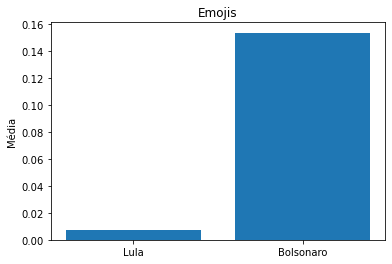

In [11]:
plt.bar(["Lula", 'Bolsonaro'], [df_lula.emojis_count.mean(), [df_bolsonaro.emojis_count.mean()]])
plt.ylabel("Média")
plt.title("Emojis")

### 4.1.2 - Comparação do uso médio de hashtags

Text(0.5, 1.0, 'Hashtags')

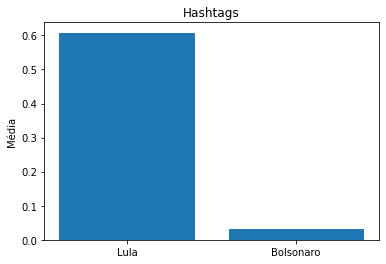

In [12]:
plt.bar(["Lula", 'Bolsonaro'], [df_lula.hastag_count.mean(), [df_bolsonaro.hastag_count.mean()]])
plt.ylabel("Média")
plt.title("Hashtags")

### 4.1.3 - Comparação do uso médio de marcações

Text(0.5, 1.0, 'Marcações')

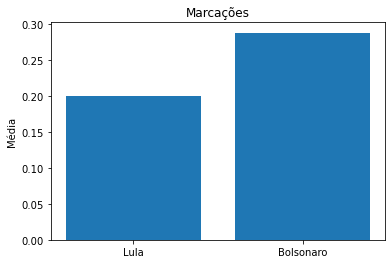

In [13]:
plt.bar(["Lula", 'Bolsonaro'], [df_lula.mark_count.mean(), [df_bolsonaro.mark_count.mean()]])
plt.ylabel("Média")
plt.title("Marcações")

### 3.1.4 - Comparação do uso médio de frases

Text(0.5, 1.0, 'Frases')

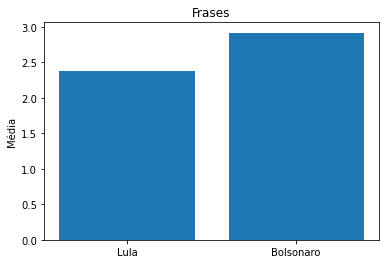

In [14]:
plt.bar(["Lula", 'Bolsonaro'], [df_lula.frases.mean(), [df_bolsonaro.frases.mean()]])
plt.ylabel("Média")
plt.title("Frases")

### 4.1.5 - Comparação do uso médio de uppercase

Text(0.5, 1.0, 'Uppercases')

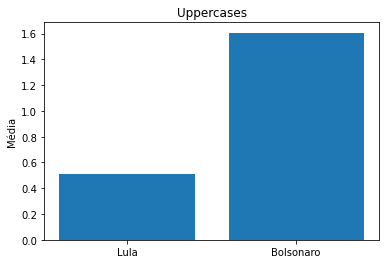

In [15]:
plt.bar(["Lula", 'Bolsonaro'], [df_lula.upper_count.mean(), [df_bolsonaro.upper_count.mean()]])
plt.ylabel("Média")
plt.title("Uppercases")

### 4.1.6 - Comparação do uso médio de palavras
Obs: Relevante no random forest

Text(0.5, 1.0, 'Palavras')

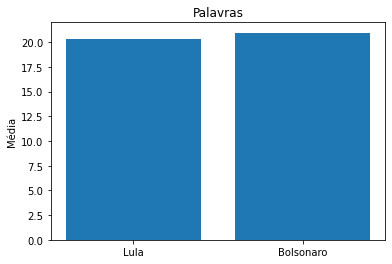

In [16]:
plt.bar(["Lula", 'Bolsonaro'], [df_lula.word_count.mean(), [df_bolsonaro.word_count.mean()]])
plt.ylabel("Média")
plt.title("Palavras")

### 4.1.7 - Comparação da média de dias para período eleitoral presidencial

Text(0.5, 1.0, 'Dias')

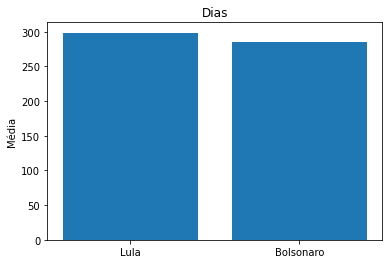

In [17]:
plt.bar(["Lula", 'Bolsonaro'], [df.query("pessoa == 'lula'").dias_eleicao_presidencial.mean(), [df.query("pessoa == 'bolsonaro'").dias_eleicao_presidencial.mean()]])
plt.ylabel("Média")
plt.title("Dias")

### 4.1.7 - Comparação da média de dias para período eleitoral municipal

Text(0.5, 1.0, 'Dias')

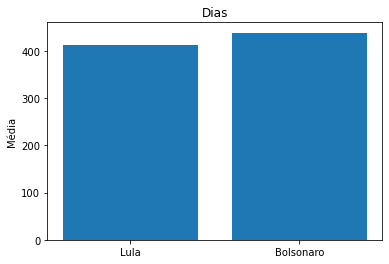

In [18]:
plt.bar(["Lula", 'Bolsonaro'], [df.query("pessoa == 'lula'").dias_eleicao_municipal.mean(), [df.query("pessoa == 'bolsonaro'").dias_eleicao_municipal.mean()]])
plt.ylabel("Média")
plt.title("Dias")

### 4.1.8 - Visualização do dado
#### Algoritmo utilizado: PCA

In [19]:
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(df.drop(columns=['full_text', 'pessoa', 'created_at']))
pca_df = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
pca_df['target'] = df['pessoa'].tolist()

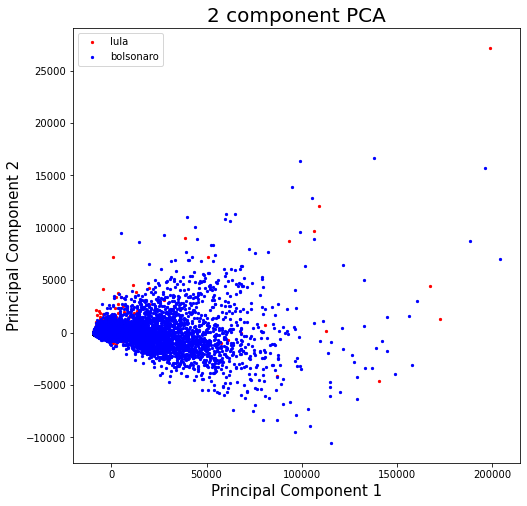

In [20]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)

targets = ['lula', 'bolsonaro']
colors = ['r', 'b']
for target, color in zip(targets,colors):
    indicesToKeep = pca_df['target'] == target
    ax.scatter(pca_df.loc[indicesToKeep, 'principal component 1']
               , pca_df.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 5)
ax.legend(targets)

## 4.2 - Separação do dado

In [21]:
x = df[['emojis_count', 'upper_count', 'hastag_count', 'mark_count', 'frases', 'word_count', 'dias_eleicao_presidencial', 'dias_eleicao_municipal']]
y = df[['pessoa']]

## 4.3 - Exemplos

In [22]:
x.head()

,emojis_count,upper_count,hastag_count,mark_count,frases,word_count,dias_eleicao_presidencial,dias_eleicao_municipal
0,0,1,0,2,3,35,51,656
2,0,2,0,0,1,15,425,282
7,0,1,2,0,3,18,398,309
8,0,0,1,0,1,14,183,524
10,0,0,0,0,1,15,667,40


## 4.4 - Treinamento e validação
### 4.4.1 - LogisticRegression
#### 4.4.1.1 - Treinamento

In [23]:
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size = 0.9, random_state=153) #Tem q ter pra representar o mundo real

In [24]:
parameters = {'solver': ['sag', 'saga', 'newton-cg', 'lbfgs', 'liblinear']}

search_params = GridSearchCV(LogisticRegression(max_iter=99999999), parameters, cv=10)
# model = search_params.fit(x.values, y.pessoa.values)
model = search_params.fit(x_train.values, y_train.pessoa.values)

C:\Users\danie\Programas\miniconda3\envs\twitter\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\Users\danie\Programas\miniconda3\envs\twitter\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\danie\Programas\miniconda3\envs\twitter\lib\site-packages\sklearn\utils\optimize.py:195: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
C:\Users\danie\Programas\miniconda3\envs\twitter\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\Users\danie\Programas\miniconda3\envs\twitter\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line sea

In [25]:
print("Melhor parametrização encontrada:", search_params.best_params_)

Melhor parametrização encontrada: {'solver': 'lbfgs'}


#### 4.4.1.2 - Predição e validação

In [26]:
predicted = model.predict(x_test)

In [27]:
acuracia = accuracy_score(predicted, y_test)
print("Acurácia:", acuracia)

Acurácia: 0.7888153053715967


In [28]:
print("Matriz de confusão:")
print(confusion_matrix(y_test, predicted, labels=["lula", "bolsonaro"]))

Matriz de confusão:
[[517 156]
 [131 555]]


### 4.4.2 - RandomForestClassifier
#### 4.4.2.1 - Treinamento

In [29]:
parameters = {'max_depth': range(5, 50, 2)} #'min_impurity_decrease': np.arange(0.8, 0.95, 0.0125), 

search_params = GridSearchCV(RandomForestClassifier(), parameters, cv=10, n_jobs=1)
model = search_params.fit(x_train.values, y_train.pessoa.values)

In [30]:
print("Melhor parametrização encontrada:", search_params.best_params_)

Melhor parametrização encontrada: {'max_depth': 17}


 #### 4.3.2.2 - Predição e validação

In [31]:
predicted = model.predict(x_test)

In [32]:
acuracia = accuracy_score(predicted, y_test)
print("Acurácia:", acuracia)

Acurácia: 0.8381162619573216


In [33]:
print("Matriz de confusão:")
print(confusion_matrix(y_test, predicted, labels=["lula", "bolsonaro"]))

Matriz de confusão:
[[560 113]
 [107 579]]


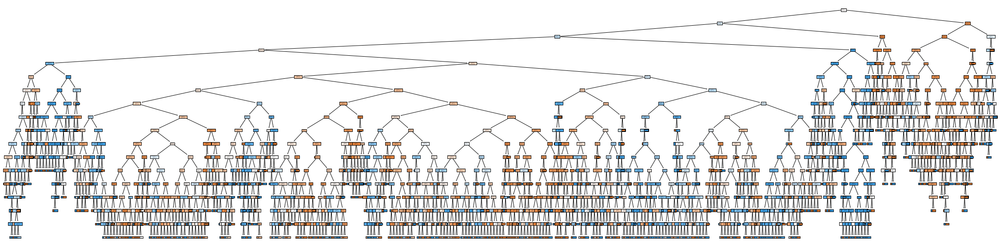

In [34]:
plt.figure(figsize=(40,10))
_ = tree.plot_tree(model.best_estimator_.estimators_[0], feature_names=x_test.columns, filled=True)

Feature: emojis_count, Score: 0.059273302909284405
Feature: upper_count, Score: 0.0998251665835666
Feature: hastag_count, Score: 0.22835412651358136
Feature: mark_count, Score: 0.03449865971968957
Feature: frases, Score: 0.08128180695029022
Feature: word_count, Score: 0.15799026756061801
Feature: dias_eleicao_presidencial, Score: 0.1641510490253587
Feature: dias_eleicao_municipal, Score: 0.1746256207376111


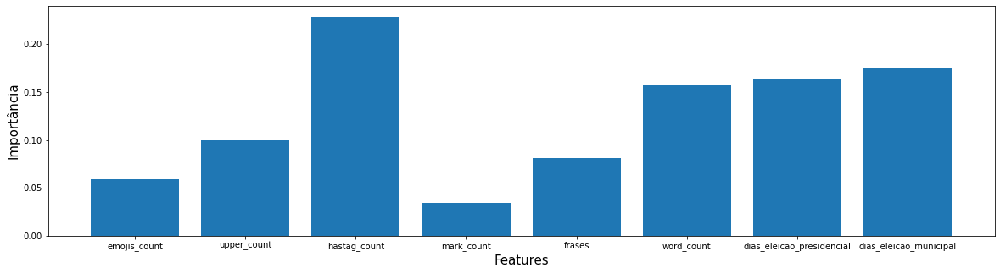

In [35]:
fig, ax = plt.subplots(1, 1, figsize=(20, 5))
importance = model.best_estimator_.feature_importances_
features_selected = x_test.columns
# summarize feature importance
for i,v in enumerate(importance):
	print(f'Feature: {features_selected[i]}, Score: {v}')
# plot feature importance
plt.bar([features_selected[x] for x in range(len(importance))], importance)
plt.xlabel("Features", fontsize=15)
plt.ylabel("Importância", fontsize=15)
plt.show()

# 5 - Previsão de engajamento
### Problema de regressão
### Algoritmos utilizados: Random forest e RNA

## 5.1 - Adição de mais features

In [36]:
df['lula'] = 0
df['bolsonaro'] = 0

df.loc[df['pessoa'] == 'lula', 'lula'] = 1
df.loc[df['pessoa'] == 'bolsonaro', 'bolsonaro'] = 1

## 5.2 - Análise de features

C:\Users\danie\Programas\miniconda3\envs\twitter\lib\site-packages\numpy\lib\stride_tricks.py:256: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  args = [np.array(_m, copy=False, subok=subok) for _m in args]
C:\Users\danie\Programas\miniconda3\envs\twitter\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


Text(0.5, 1.0, 'Retweets')

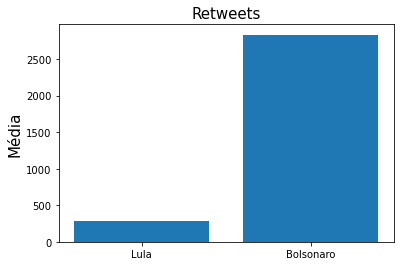

In [37]:
plt.bar(["Lula", 'Bolsonaro'], [df_lula.retweet_count.mean(), [df_bolsonaro.retweet_count.mean()]])
plt.ylabel("Média", fontsize=15)
plt.title("Retweets", fontsize=15)

## 5.3 - Separação do dado

In [38]:
x = df[['emojis_count', 'upper_count', 'hastag_count', 'mark_count', "word_count", "lula", 'bolsonaro', 'dias_eleicao_presidencial', 'dias_eleicao_municipal']]# 
y = df[['retweet_count']]

## 5.4 - Exemplos

In [39]:
x.head()

,emojis_count,upper_count,hastag_count,mark_count,word_count,lula,bolsonaro,dias_eleicao_presidencial,dias_eleicao_municipal
0,0,1,0,2,35,1,0,51,656
2,0,2,0,0,15,1,0,425,282
7,0,1,2,0,18,1,0,398,309
8,0,0,1,0,14,1,0,183,524
10,0,0,0,0,15,1,0,667,40


## 5.5 - Treinamento e validação
### 5.5.1 - Random Forest
#### 5.5.1.1 - Treinamento

In [40]:
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size = 0.9, random_state=153)

In [42]:
parameters = {'max_depth': range(5, 50, 2)} #'min_impurity_decrease': np.arange(0.8, 0.95, 0.0125), 

search_params = GridSearchCV(RandomForestRegressor(), parameters, cv=10, n_jobs=1)
model = search_params.fit(x_train.values, y_train.retweet_count.values)

In [43]:
print("Melhor parametrização encontrada:", search_params.best_params_)

Melhor parametrização encontrada: {'max_depth': 39}


#### 5.5.1.2 - Predição e validação

In [44]:
predicted = model.predict(x_test)

R2: 0.5665777179568083
RMSE: 2154.725675751459
MAE: 938.9166212987056


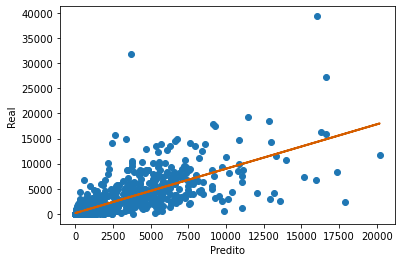

In [47]:
plt.scatter(predicted, y_test)
plt.ylabel("Real")
plt.xlabel("Predito")

slope, intercept, r_value, p_value, std_err = stats.linregress(predicted, y_test.retweet_count)
plt.plot(predicted, intercept + (predicted * slope), color='#D55E00', linestyle='-', linewidth=2)
print("R2:", r_value**2)
print("RMSE:", mean_squared_error(predicted, y_test.retweet_count)**(1/2))
print("MAE:", mean_absolute_error(predicted, y_test.retweet_count))

In [ ]:
# plt.figure(figsize=(40,10))
# _ = tree.plot_tree(model.best_estimator_.estimators_[0], feature_names=x_test.columns, filled=True)

Feature: emojis_count, Score: 0.02030597279601998
Feature: upper_count, Score: 0.046720713835425594
Feature: hastag_count, Score: 0.00621644352712632
Feature: mark_count, Score: 0.028116396659261262
Feature: word_count, Score: 0.2804260057751546
Feature: lula, Score: 0.07934869518678928
Feature: bolsonaro, Score: 0.08635914266510883
Feature: dias_eleicao_presidencial, Score: 0.1943251640371181
Feature: dias_eleicao_municipal, Score: 0.25818146551799614


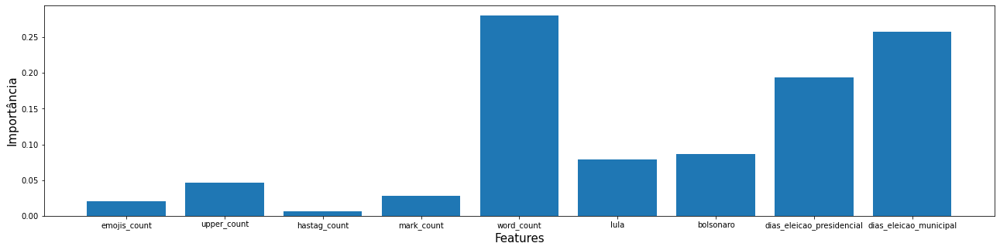

In [53]:
fig, ax = plt.subplots(1, 1, figsize=(22, 5))
importance = model.best_estimator_.feature_importances_
features_selected = x_test.columns
# summarize feature importance
for i,v in enumerate(importance):
	print(f'Feature: {features_selected[i]}, Score: {v}')
# plot feature importance
plt.bar([features_selected[x] for x in range(len(importance))], importance)
plt.xlabel("Features", fontsize=15)
plt.ylabel("Importância", fontsize=15)
plt.show()

### 5.5.2 - RNA
#### 5.5.2.1 - Normalização

In [54]:
max_emojis_count = x.emojis_count.max()
max_upper_count = x.upper_count.max()
max_hastag_count = x.hastag_count.max()
max_mark_count = x.mark_count.max()
max_dias_eleicao_presidencial = x.dias_eleicao_presidencial.max()
max_dias_eleicao_municipal = x.dias_eleicao_municipal.max()
max_word_count = x.word_count.max()

In [55]:
def normalize(row):
    emojis_count = row.emojis_count/max_emojis_count
    upper_count = row.upper_count/max_upper_count
    hastag_count = row.hastag_count/max_hastag_count
    mark_count = row.mark_count/max_mark_count
    dias_eleicao_presidencial = row.dias_eleicao_presidencial/max_dias_eleicao_presidencial
    dias_eleicao_municipal = row.dias_eleicao_municipal/max_dias_eleicao_municipal
    lula = row.lula
    bolsonaro = row.bolsonaro
    word_count = row.word_count/max_word_count
    return {'emojis_count': emojis_count, 'upper_count': upper_count, 'hastag_count': hastag_count, 'mark_count': mark_count, 'lula': lula, 'bolsonaro': bolsonaro, 'dias_eleicao_municipal': dias_eleicao_municipal, 'dias_eleicao_presidencial': dias_eleicao_presidencial, 'word_count': word_count}

In [56]:
x_norm = x.apply(lambda x: normalize(x), axis=1)
x_norm = pd.DataFrame(x_norm.tolist())

y_norm = y/y.retweet_count.max()

#### 5.5.2.2 - Separação do dado

In [57]:
x_train_full, x_val, y_train_full, y_val = train_test_split(x_norm, y_norm, train_size=0.9, random_state=153)

test_size = 0.8
x_train = x_train_full[:int(len(x_train_full) * test_size)]
y_train = y_train_full[:int(len(y_train_full) * test_size)]

x_test = x_train_full[int(len(x_train_full) * test_size):]
y_test = y_train_full[int(len(y_train_full) * test_size):]

#### 5.5.2.3 - Treinamento

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 30)                300       
_________________________________________________________________
dense_1 (Dense)              (None, 20)                620       
_________________________________________________________________
dense_2 (Dense)              (None, 10)                210       
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 11        
Total params: 1,141
Trainable params: 1,141
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
306/306 [==============================] - 4s 5ms/step - loss: 0.0071 - val_loss: 0.0033
Epoch 2/20
306/306 [==============================] - 1s 4ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 3/20
306/306 [==============================] 

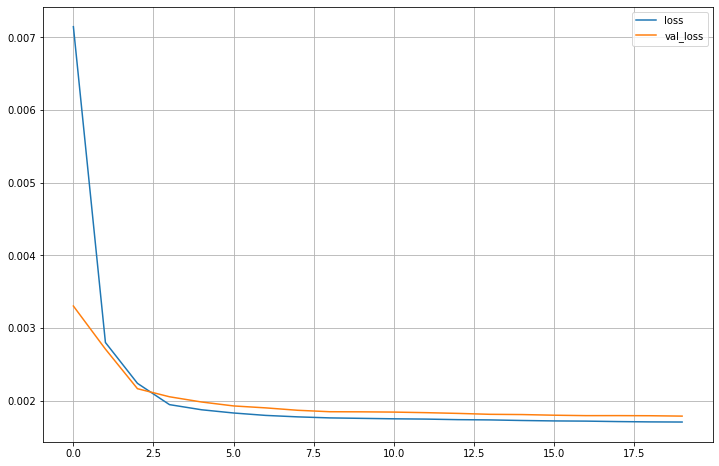

In [58]:
learning_rate = 0.0001
epochs = 20

model = models.Sequential()
model.add(layers.Input(shape=(9,)))
model.add(layers.Dense(30, activation='relu'))
model.add(layers.Dense(20, activation='relu'))
model.add(layers.Dense(10, activation='relu'))
model.add(layers.Dense(1))

optimizer = optimizers.Adam(learning_rate=learning_rate)

model.summary()
model.compile(loss="mse", optimizer=optimizer)

history = model.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=epochs)

pd.DataFrame(history.history).plot(figsize=(12, 8))
plt.grid(True)
plt.show()
plt.close()

#### 5.5.2.4 - Predição e validação

In [59]:
predicted = model.predict(x_test)
predicted = pd.DataFrame(predicted, columns = ['retweet_count'])

R2: 0.41067433212892673


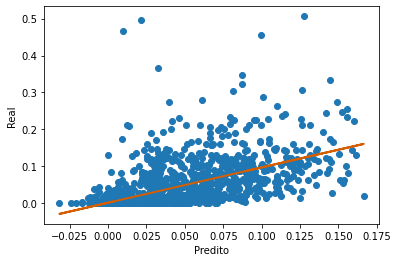

In [60]:
plt.scatter(predicted, y_test)
plt.ylabel("Real")
plt.xlabel("Predito")

slope, intercept, r_value, p_value, std_err = stats.linregress(predicted.retweet_count, y_test.retweet_count)
plt.plot(predicted, intercept + (predicted * slope), color='#D55E00', linestyle='-', linewidth=2)
print("R2:", r_value**2)